In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.utils as vutils
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image
from tqdm import tqdm

In [15]:
# --------- Setup ---------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [16]:
class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        s = self.pool(x).view(b, c)
        s = self.fc(s).view(b, c, 1, 1)
        return x * s

In [17]:
class Residual_Block(nn.Module):
    def __init__(self, in_ch = 256, out_ch = 256, k_size = 3, s = 1, p = 1):
        super(Residual_Block, self).__init__()

        self.conv_1 = nn.Conv2d(in_channels = in_ch, out_channels = out_ch, kernel_size= k_size, stride = s, padding = p, device=DEVICE)
        self.conv_2 = nn.Conv2d(in_channels = out_ch, out_channels = out_ch, kernel_size= k_size, stride = s, padding = p, device=DEVICE)

        self.norm_1 = nn.InstanceNorm2d(num_features = out_ch, device=DEVICE)
        self.norm_2 = nn.InstanceNorm2d(num_features = out_ch, device=DEVICE)

        self.relu = nn.ReLU()

    def forward(self, x):
        output = self.conv_1(x)
        output = self.norm_1(output)
        output = self.relu(output)
        output = self.conv_2(output)
        output = self.norm_2(output)

        return x + output

In [18]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, n_blocks=3, channels=256):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels = 3, out_channels = 64, kernel_size= 7, stride = 1, padding = 3, device=DEVICE),
            nn.InstanceNorm2d(num_features = 64, device=DEVICE),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size= 3, stride = 2, padding = 1, device=DEVICE),
            nn.InstanceNorm2d(num_features = 128, device=DEVICE),
            nn.ReLU(),
            nn.Conv2d(in_channels = 128, out_channels = 256, kernel_size= 3, stride = 2, padding = 1, device=DEVICE),
            nn.InstanceNorm2d(num_features = 256, device=DEVICE),
            nn.ReLU()
        )
            
        self.first_residual = Residual_Block(channels)
        self.middle = nn.Sequential(*[SEBlock(channels) for _ in range(n_blocks)])
        self.last_residual = Residual_Block(channels)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(in_channels = 256, out_channels = 128, kernel_size = 3, stride = 2, padding = 1, output_padding = 1, device = DEVICE),
            nn.InstanceNorm2d(num_features = 128, device=DEVICE),
            nn.ReLU(),
            nn.ConvTranspose2d(in_channels = 128, out_channels = 64, kernel_size = 3, stride = 2, padding = 1, output_padding = 1, device = DEVICE),
            nn.InstanceNorm2d(num_features = 64, device=DEVICE),
            nn.ReLU(),
            nn.Conv2d(in_channels = 64, out_channels = 3, kernel_size = 7, stride = 1, padding = 3, device = DEVICE),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.first_residual(x)
        x = self.middle(x)
        x = self.last_residual(x)
        return self.decoder(x)

In [20]:
# --------- Load Pretrained Generator ---------
G1_R2A = Generator().to(DEVICE)
G1_R2A.load_state_dict(torch.load("/kaggle/input/gan_custom/pytorch/default/1/G1_R2A_9.pth", map_location=DEVICE))
G1_R2A.eval()

/tmp/ipykernel_31/1817297960.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  G1_R2A.load_state_dict(torch.load("/kaggle/input/gan_custom/pytorch/default/1/G1_R2A_9.pth",

Generator(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (2): ReLU()
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (5): ReLU()
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (8): ReLU()
  )
  (first_residual): Residual_Block(
    (conv_1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (conv_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (norm_1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (norm_2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
 

In [21]:
# --------- Load Real Images ---------
image_dir = "/kaggle/input/generated-images/images"
image_files = sorted([file for file in os.listdir(image_dir) if file.endswith(('.png', '.jpg', '.jpeg', '.webp'))])
print(image_files)

['00002.webp', '00003.webp', '00004.webp', '00005.webp', '00006.webp', '00007.webp', '00008.webp', '00009.webp', '00010.webp', '00011.webp', '00012.webp', '00013.webp', '00014.webp', '00015.webp', '00016.webp', '00017.webp', '00018.webp', '00019.webp', '00020.webp', '00021.webp', '00022.webp', '00023.webp', '00024.webp', '00025.webp', '00027.webp', '00028.webp', '00029.webp', '00030.webp', '00031.webp']


In [22]:
# --------- Helper Function ---------
def show_images(real_img, fake_anime, title=""):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    axes[0].imshow(vutils.make_grid(real_img, normalize=True).permute(1, 2, 0).cpu().numpy())
    axes[0].set_title("Real Image")
    axes[0].axis("off")

    axes[1].imshow(vutils.make_grid(fake_anime, normalize=True).permute(1, 2, 0).cpu().numpy())
    axes[1].set_title("Generated Anime")
    axes[1].axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

  0%|          | 0/29 [00:00<?, ?it/s]

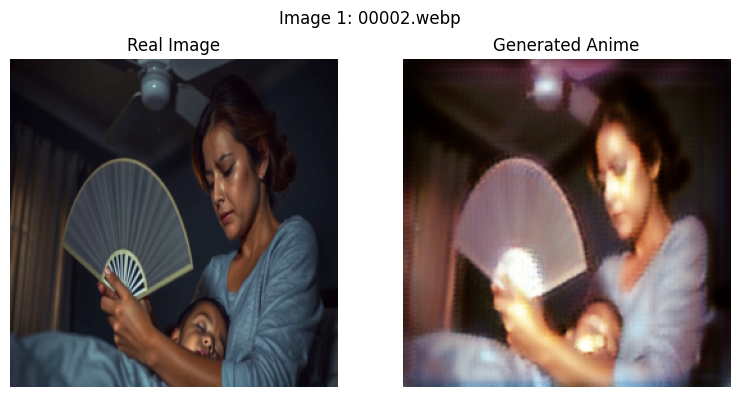

  3%|▎         | 1/29 [00:00<00:10,  2.75it/s]

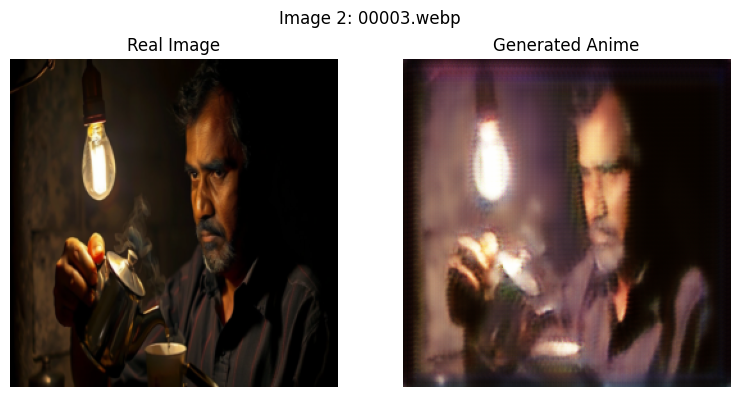

  7%|▋         | 2/29 [00:00<00:08,  3.28it/s]

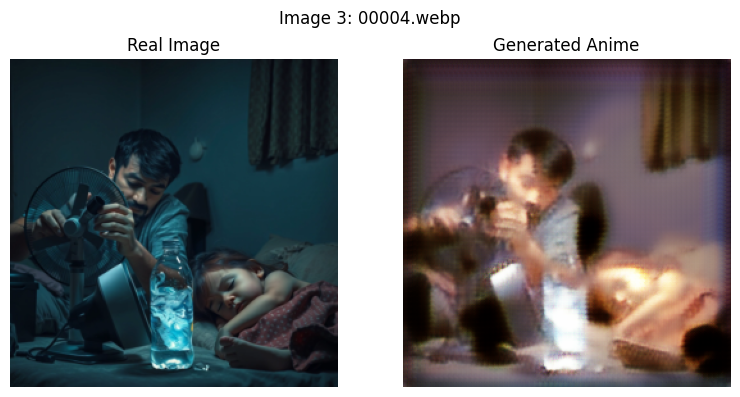

 10%|█         | 3/29 [00:00<00:07,  3.35it/s]

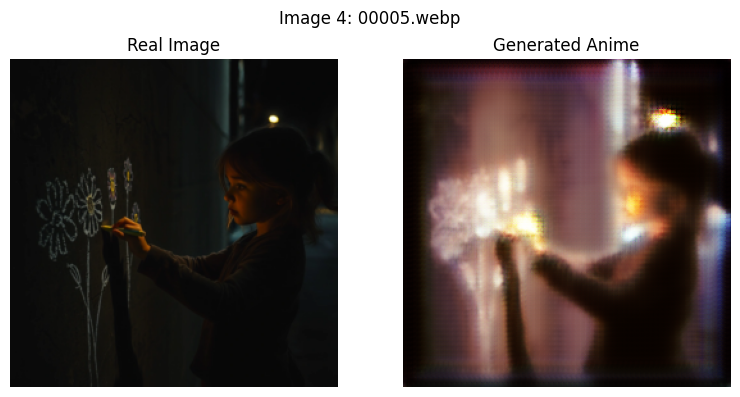

 14%|█▍        | 4/29 [00:01<00:07,  3.48it/s]

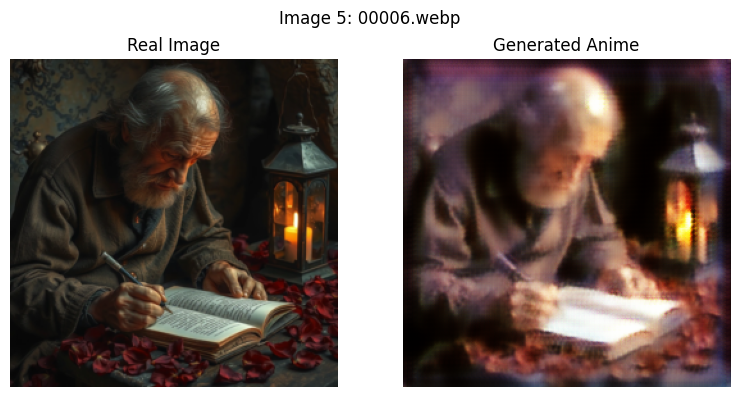

 17%|█▋        | 5/29 [00:01<00:07,  3.39it/s]

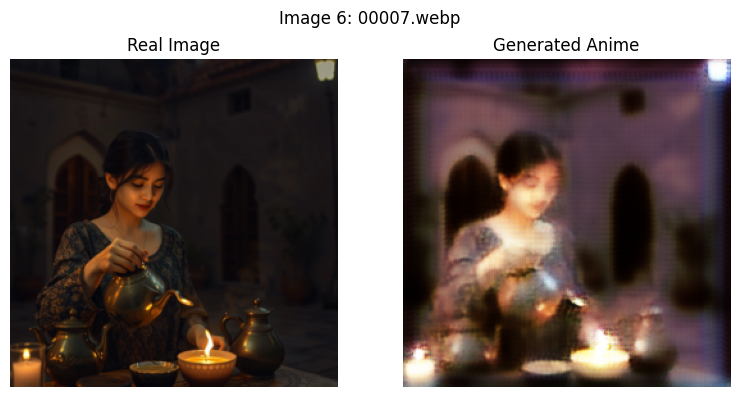

 21%|██        | 6/29 [00:01<00:06,  3.41it/s]

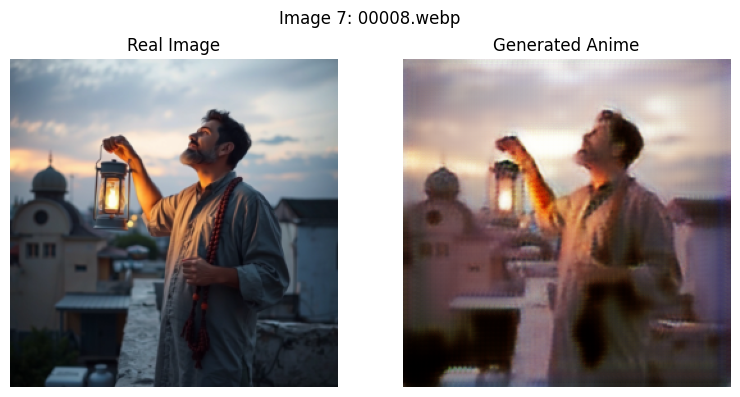

 24%|██▍       | 7/29 [00:02<00:06,  3.42it/s]

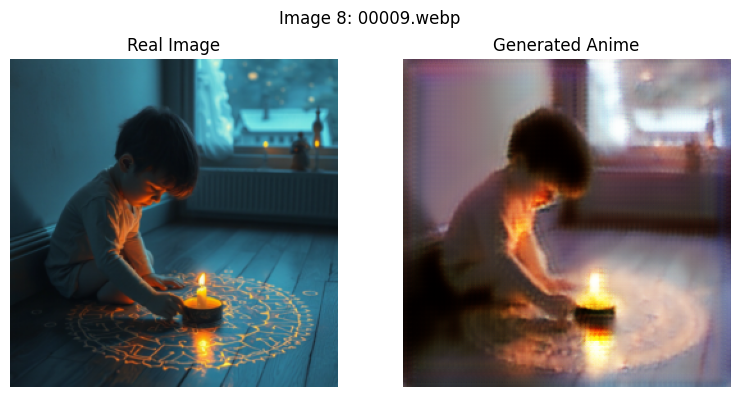

 28%|██▊       | 8/29 [00:02<00:06,  3.41it/s]

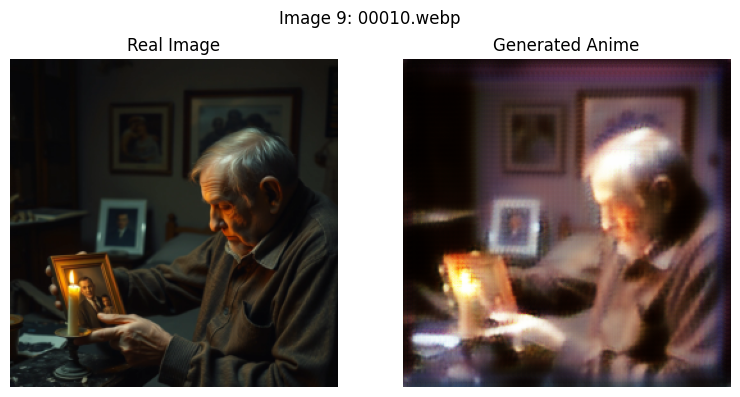

 31%|███       | 9/29 [00:02<00:05,  3.43it/s]

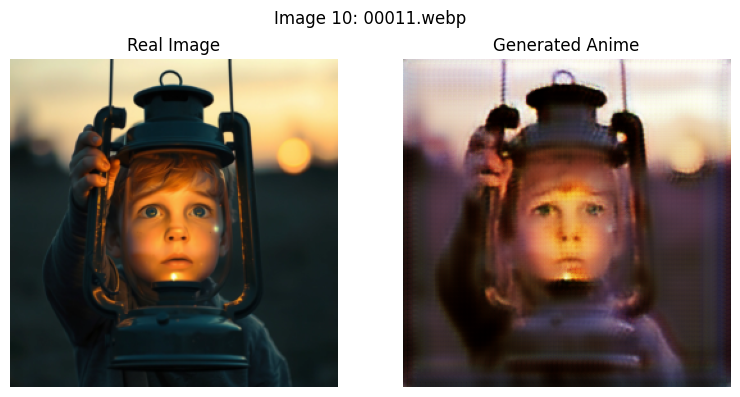

 34%|███▍      | 10/29 [00:02<00:05,  3.43it/s]

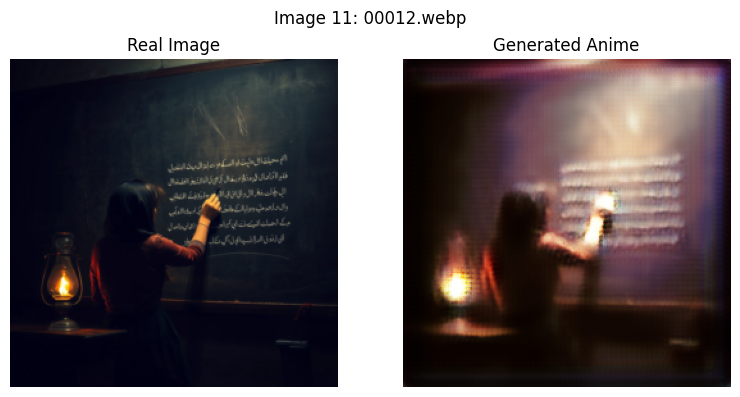

 38%|███▊      | 11/29 [00:03<00:05,  3.50it/s]

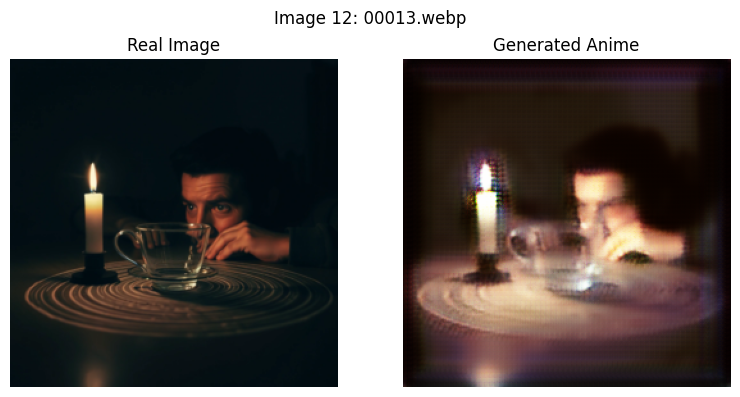

 41%|████▏     | 12/29 [00:03<00:04,  3.56it/s]

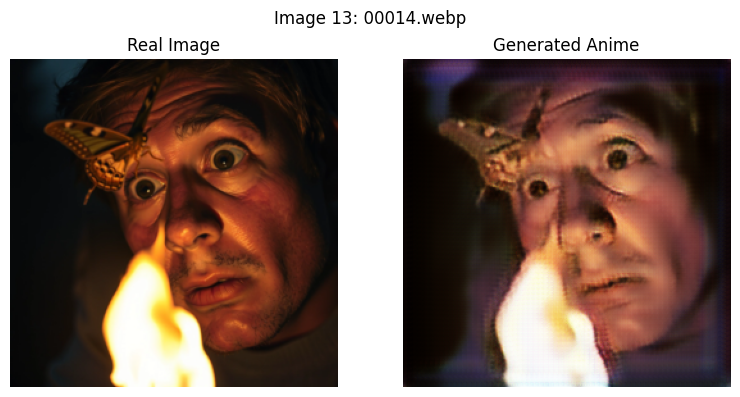

 45%|████▍     | 13/29 [00:03<00:04,  3.54it/s]

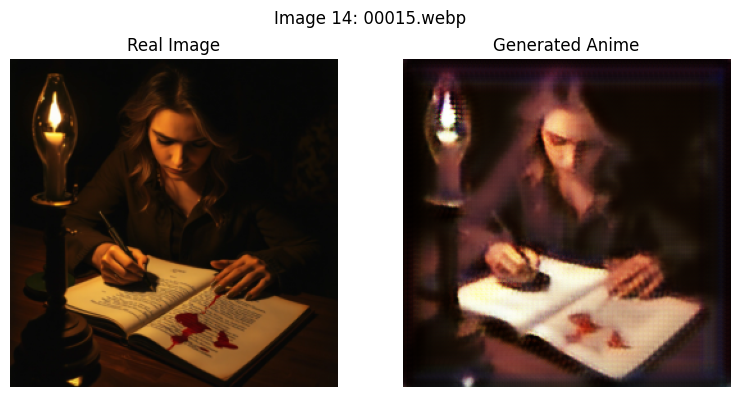

 48%|████▊     | 14/29 [00:04<00:04,  3.53it/s]

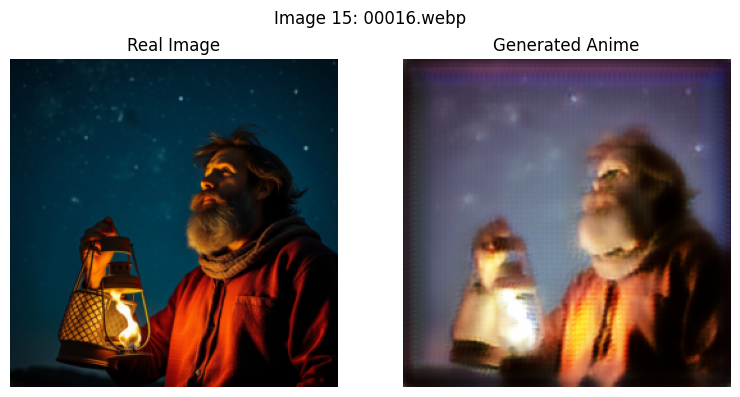

 52%|█████▏    | 15/29 [00:04<00:03,  3.51it/s]

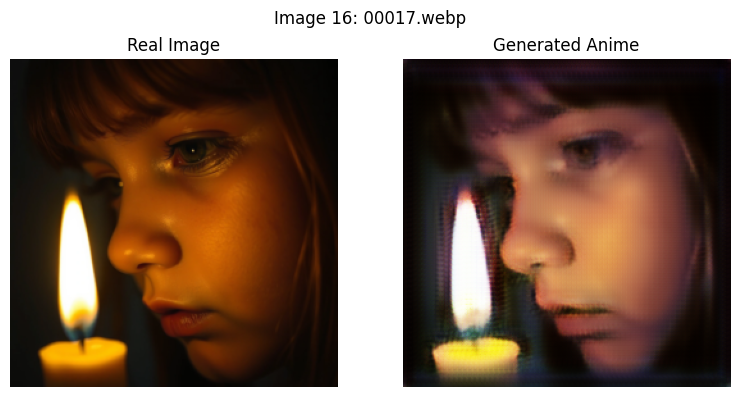

 55%|█████▌    | 16/29 [00:04<00:03,  3.51it/s]

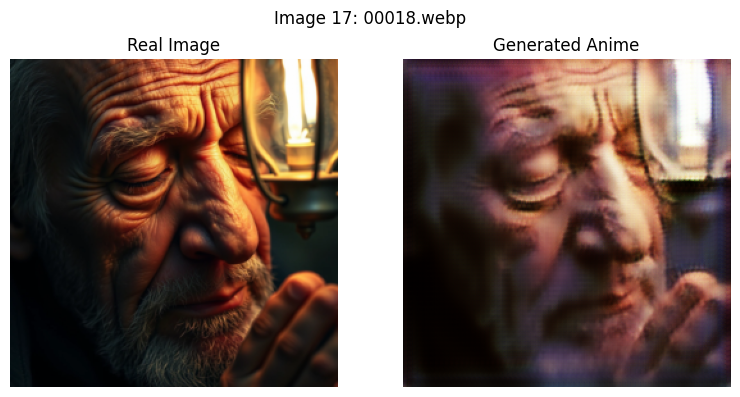

 59%|█████▊    | 17/29 [00:04<00:03,  3.46it/s]

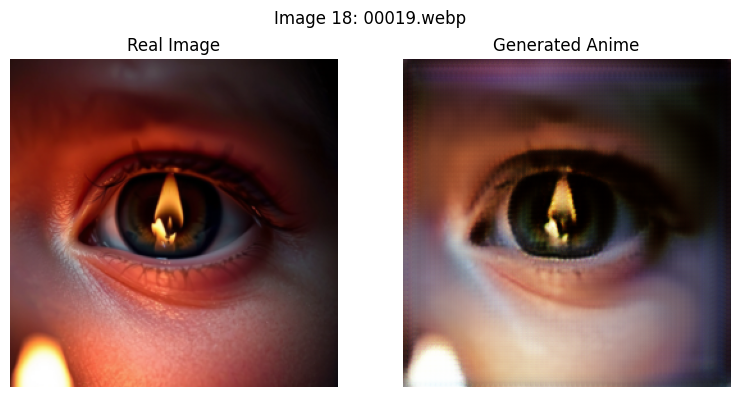

 62%|██████▏   | 18/29 [00:05<00:03,  3.47it/s]

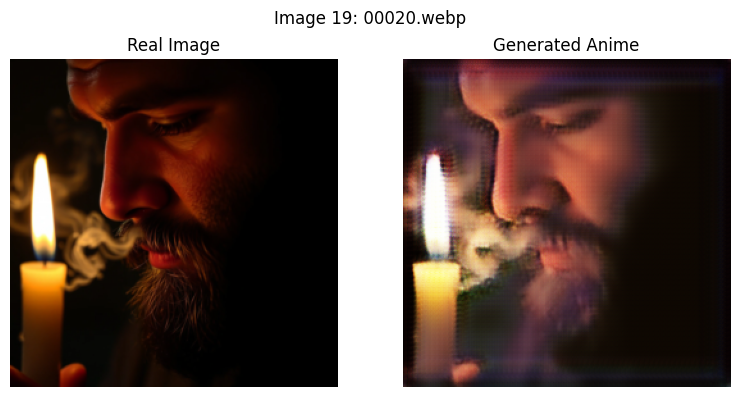

 66%|██████▌   | 19/29 [00:05<00:02,  3.54it/s]

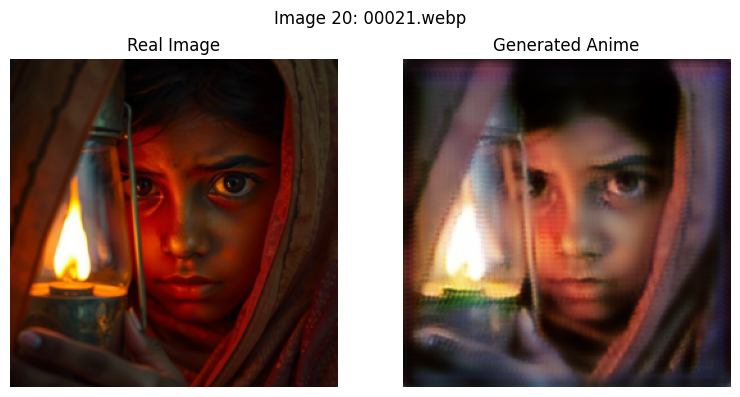

 69%|██████▉   | 20/29 [00:05<00:02,  3.46it/s]

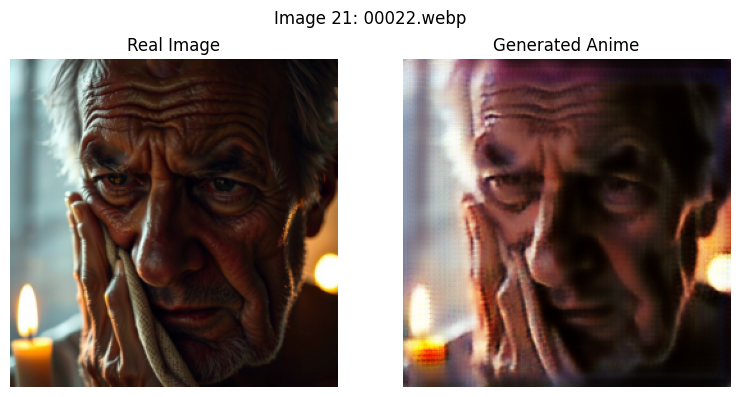

 72%|███████▏  | 21/29 [00:06<00:02,  3.42it/s]

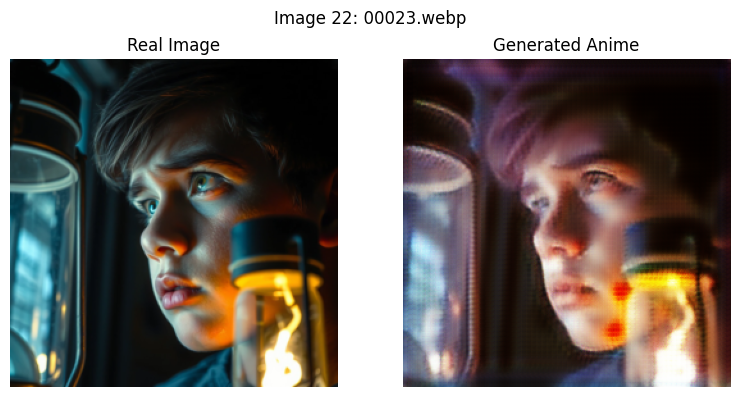

 76%|███████▌  | 22/29 [00:06<00:02,  3.42it/s]

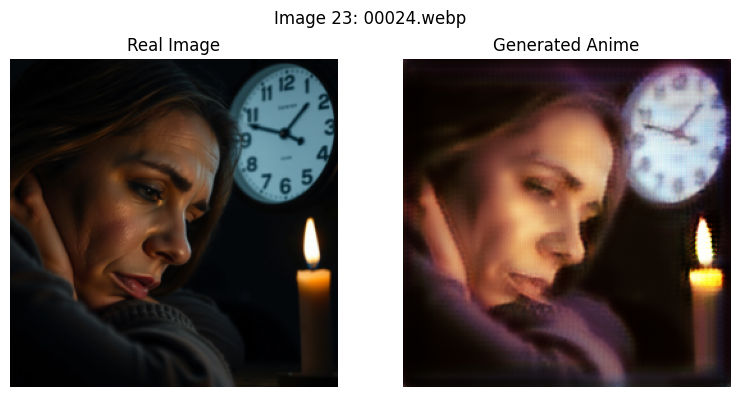

 79%|███████▉  | 23/29 [00:06<00:01,  3.46it/s]

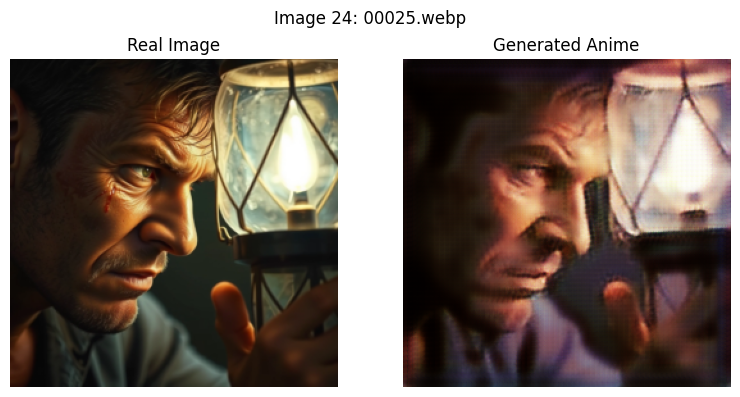

 83%|████████▎ | 24/29 [00:06<00:01,  3.44it/s]

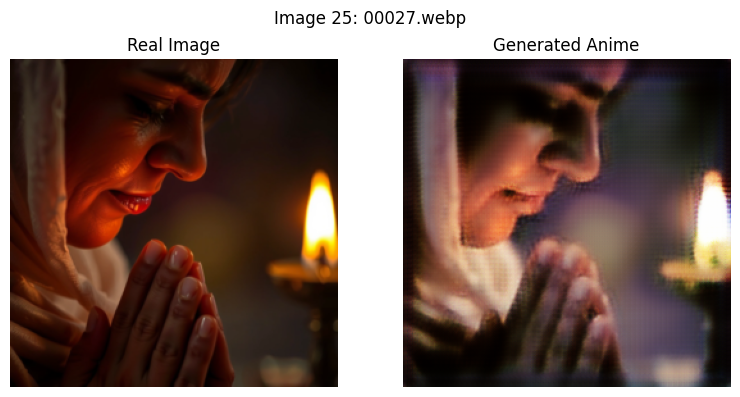

 86%|████████▌ | 25/29 [00:07<00:01,  3.43it/s]

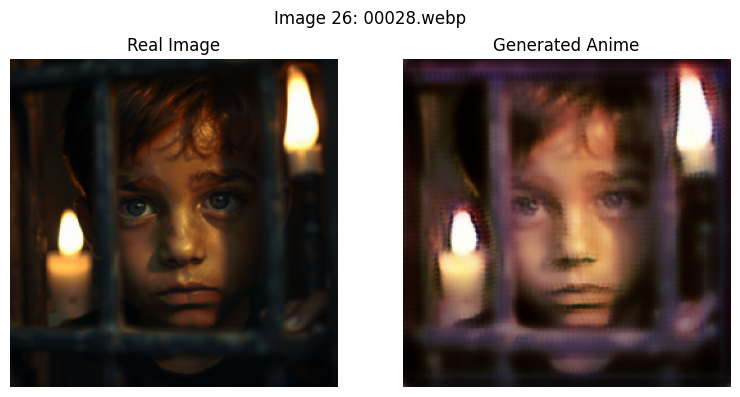

 90%|████████▉ | 26/29 [00:07<00:01,  2.79it/s]

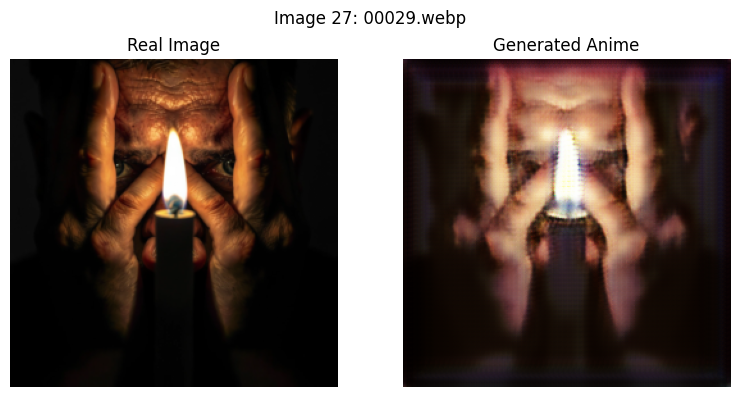

 93%|█████████▎| 27/29 [00:08<00:00,  3.00it/s]

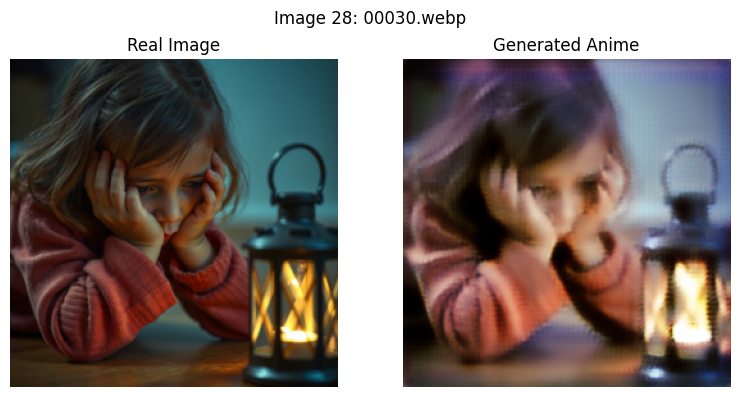

 97%|█████████▋| 28/29 [00:08<00:00,  3.00it/s]

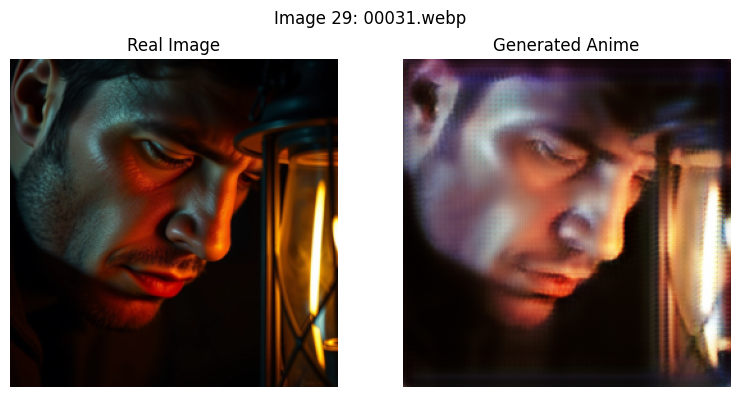

100%|██████████| 29/29 [00:08<00:00,  3.33it/s]


In [23]:
# --------- Inference ---------
for i, img_file in enumerate(tqdm(image_files)):
    img_path = os.path.join(image_dir, img_file)

    # Load and preprocess
    image = Image.open(img_path).convert("RGB")
    real_tensor = transform(image).unsqueeze(0).to(DEVICE)

    # Generate fake anime
    with torch.no_grad():
        fake_tensor = G1_R2A(real_tensor)

    # Show images
    show_images(real_tensor, fake_tensor, title=f"Image {i+1}: {img_file}")